# Human thymus analysis

In [1]:
import scanpy as sc
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scvelo as scv
import scanpy.external as sce
import os

PROJECT_DIR = "/home/sisaev/projects/Gustafsson_et_al_2022"
DATA_DIR = "/home/sisaev/data/thymus_Karin/count"
exec(open(f"{PROJECT_DIR}/tools/tools.py").read())

sc.settings.verbosity = 3
sns.set(font_scale=1)
sc.settings.set_figure_params(dpi=150)
sns.set_style("white")

Reds = get_beautiful_cmap()

## Common embedding

In [4]:
adata = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_AllCells.h5ad")
os.mkdir(f"{PROJECT_DIR}/data/Human_AllCells_pagoda2_conos/")
adata = run_conos_pagoda2(
    adata,
    batch_key="sample_id",
    tmp_dir=f"{PROJECT_DIR}/data/Human_AllCells_pagoda2_conos/",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


running Leiden clustering
    finished: found 35 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


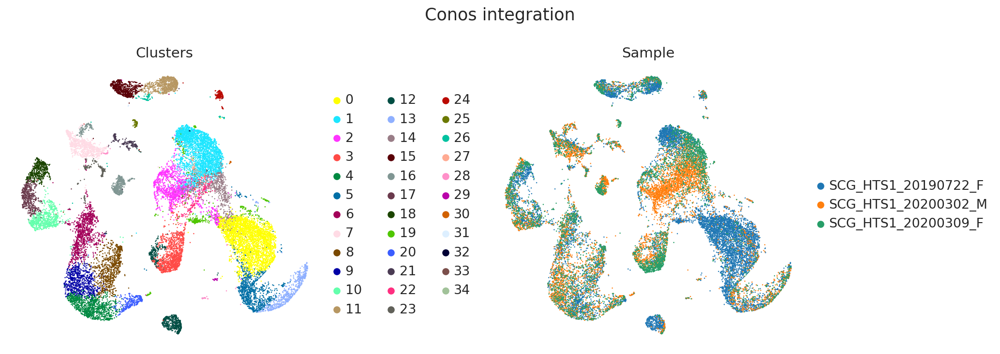

In [16]:
sc.tl.leiden(adata, resolution=2)

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(14, 5))
sc.pl.umap(adata, color=["leiden"], frameon=False, title="Clusters", ax=axes[0], show=False)
sc.pl.umap(adata, color=["sample_id"], frameon=False, title="Sample", ax=axes[1], show=False)
fig.suptitle("Conos integration")
fig.tight_layout()

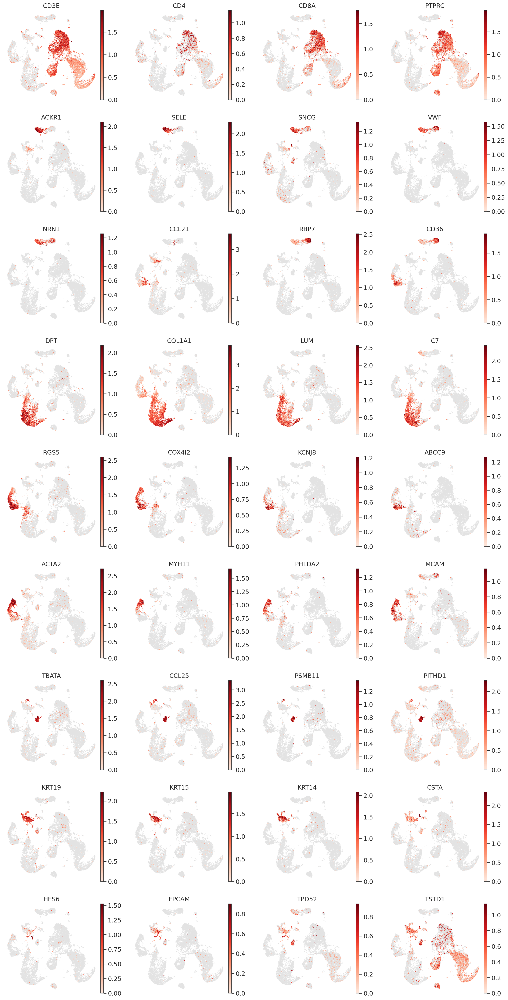

In [33]:
sc.pl.umap(
    adata,
    color=[
        "CD3E", "CD4", "CD8A", "PTPRC", # HC
        "ACKR1", "SELE", "SNCG", "VWF", # aEC
        "NRN1", "CCL21", "RBP7", "CD36", # lyECx2, pcECx2
        "DPT", "COL1A1", "LUM", "C7", # MC
        "RGS5", "COX4I2", "KCNJ8", "ABCC9", # PVx2, pcPVx2
        "ACTA2", "MYH11", "PHLDA2", "MCAM", # aPV
        "TBATA", "CCL25", "PSMB11", "PITHD1", # cTEC
        "KRT19", "KRT15", "KRT14", "CSTA", # mTECimm
        "HES6", "EPCAM", "TPD52", "TSTD1" # mTECmn
    ],
    cmap=Reds,
    frameon=False,
    ncols=4
)

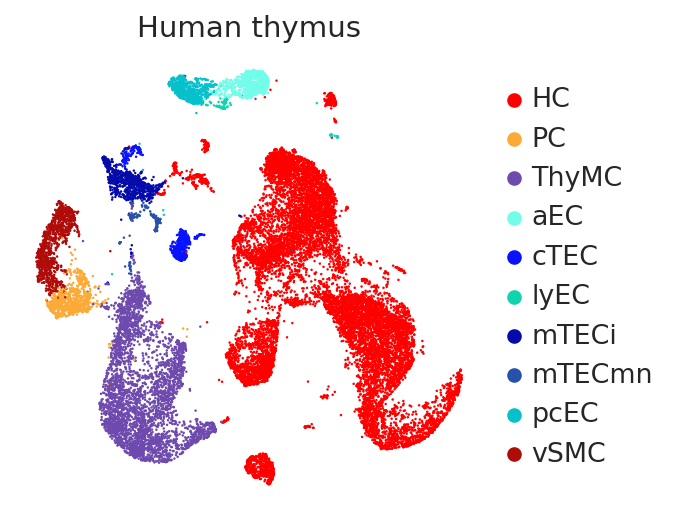

In [2]:
ct_to_leiden = {
    "HC" : ["0", "1", "2", "3", "5", "12", "13", "14", "19", "22",
            "27", "28", "29", "30", "32", "33", "34", "25", "24",
            "21"],
    "ThyMC" : ["4", "6", "8", "9", "20"],
    "pcEC" : ["15"],
    "lyEC" : ["26"],
    "aEC" : ["11"],
    "vSMC" : ["17", "18"],
    "PC" : ["10"],
    "cTEC" : ["16"],
    "mTECi" : ["7"],
    "mTECmn" : ["23"],
    "Unknown" : ["31"]
}

paper_cmap = {
    "aEC" : "#06c1cc",
    "lyEC" : "#10d4ae",
    "pcEC" : "#71fdea",
    "vSMC" : "#ae0b09",
    "PC" : "#fda936",
    "ThyMC" : "#6e4aae",
    "HC" : "#ff0000",
    "cTEC" : "#0912ff",
    "mTECi" : "#050bab",
    "mTECmn" : "#2751ab",
    "COL15A1+ ThyMC" : "#00b3f4",
    "CD248+ ThyMC" : "#008af6",
    "POSTN+ ThyMC" : "#ed00ff",
    "COL15A1+ ThyMC (stress)" : "#00573e",
    "Cycling ThyMC" : "#00573e"
}

leiden_to_ct = {}
for ct in ct_to_leiden:
    for leiden in ct_to_leiden[ct]:
        leiden_to_ct[leiden] = ct
adata.obs["cell_type"] = [leiden_to_ct[leiden] for leiden in adata.obs.leiden]
adata = adata[adata.obs.cell_type != "Unknown"]
adata.obs["cell_type"] = adata.obs["cell_type"].astype("category")
adata.uns["cell_type_colors"] = [paper_cmap[cell_type] for cell_type in adata.obs["cell_type"].cat.categories]

sc.pl.umap(adata, color="cell_type", frameon=False, title="Human thymus")

## Mesenchymal cells

In [104]:
adata_MC = adata[adata.obs.cell_type == "ThyMC"].copy()
adata_MC.X = adata_MC.layers["counts"].copy()
os.mkdir(f"{PROJECT_DIR}/data/Human_MC_pagoda2_conos/")
adata_MC = run_conos_pagoda2(
    adata_MC,
    batch_key="sample_id",
    n_hvg=1000,
    n_comps=15,
    tmp_dir=f"{PROJECT_DIR}/data/Human_MC_pagoda2_conos/",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


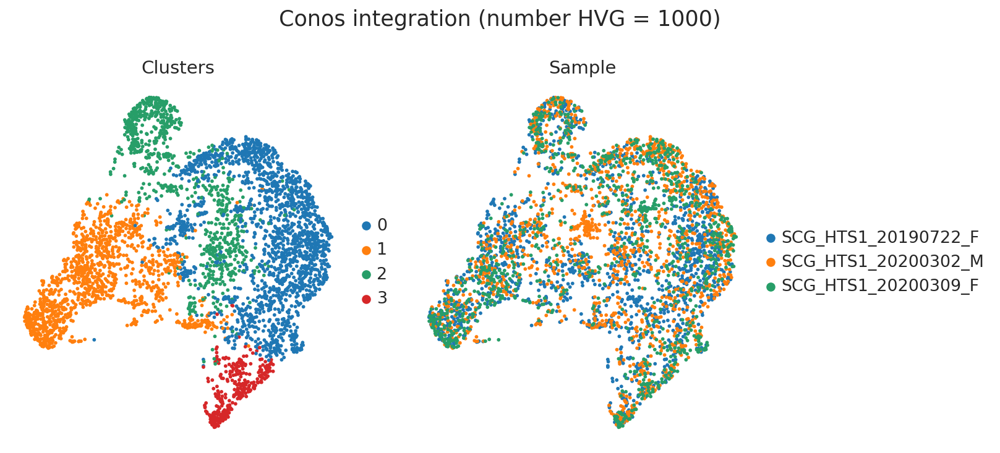

In [106]:
sc.tl.leiden(adata_MC, resolution=0.3)

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(11, 5))
sc.pl.umap(adata_MC, color=["leiden"], frameon=False, title="Clusters", ax=axes[0], show=False)
sc.pl.umap(adata_MC, color=["sample_id"], frameon=False, title="Sample", ax=axes[1], show=False)
fig.suptitle("Conos integration (number HVG = 1000)")
fig.tight_layout()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


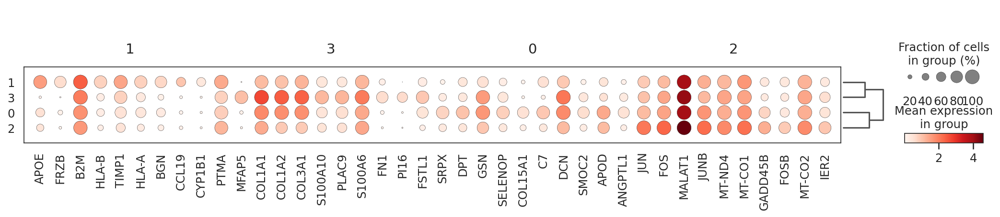

In [94]:
sc.tl.rank_genes_groups(adata_MC, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata_MC, n_genes=10)

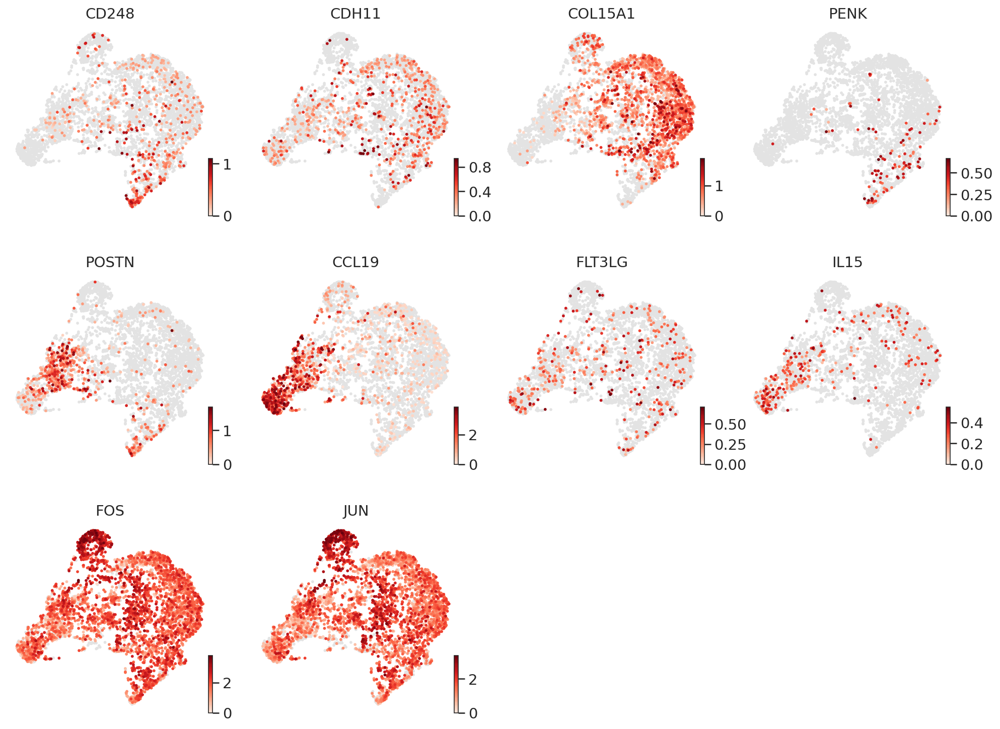

In [4]:
scv.pl.umap(
    adata_MC,
    color=[
        "CD248", "CDH11", "COL15A1", "PENK", "POSTN",
        "CCL19", "FLT3LG", "IL15", "FOS",
        "JUN"
    ],
    cmap=Reds,
    ncols=4
)

<AxesSubplot:title={'center':'Mesenchymal cells\n(annotation level 3)'}, xlabel='UMAP1', ylabel='UMAP2'>

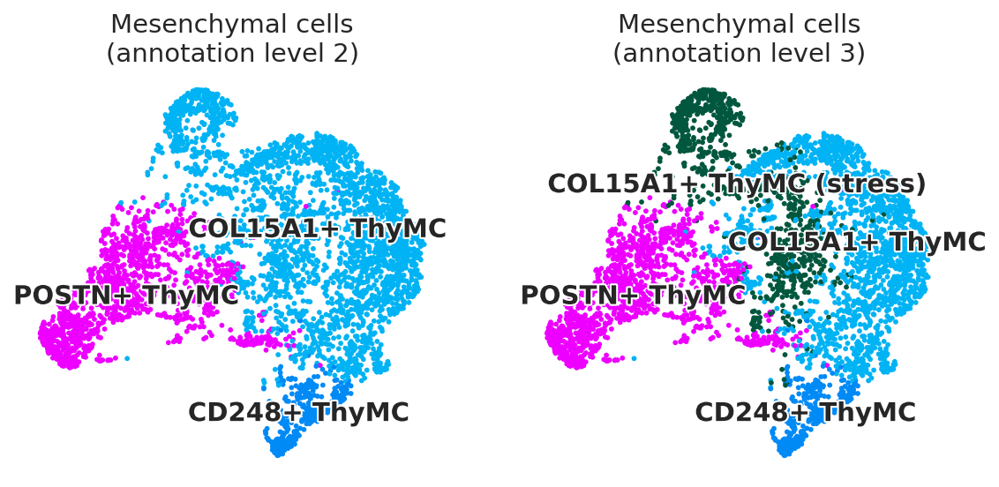

In [5]:
MC_annotation_l2 = {
    "0" : "COL15A1+ ThyMC",
    "1" : "POSTN+ ThyMC",
    "2" : "COL15A1+ ThyMC",
    "3" : "CD248+ ThyMC"
}

MC_annotation_l3 = {
    "0" : "COL15A1+ ThyMC",
    "1" : "POSTN+ ThyMC",
    "2" : "COL15A1+ ThyMC (stress)",
    "3" : "CD248+ ThyMC"
}

adata_MC.obs["cell_type_l2"] = [MC_annotation_l2[leiden] for leiden in adata_MC.obs.leiden]
adata_MC.obs["cell_type_l2"] = adata_MC.obs["cell_type_l2"].astype("category")
adata_MC.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata_MC.obs["cell_type_l2"].cat.categories]

adata_MC.obs["cell_type_l3"] = [MC_annotation_l3[leiden] for leiden in adata_MC.obs.leiden]
adata_MC.obs["cell_type_l3"] = adata_MC.obs["cell_type_l3"].astype("category")
adata_MC.uns["cell_type_l3_colors"] = [paper_cmap[cell_type] for cell_type in adata_MC.obs["cell_type_l3"].cat.categories]

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(9, 4))
sc.pl.umap(adata_MC, color=["cell_type_l2"], title=["Mesenchymal cells\n(annotation level 2)"], frameon=False, ax=axes[0],
           legend_loc="on data", show=False, legend_fontoutline=2)
sc.pl.umap(adata_MC, color=["cell_type_l3"], title=["Mesenchymal cells\n(annotation level 3)"], frameon=False, ax=axes[1],
           legend_loc="on data", show=False, legend_fontoutline=2)

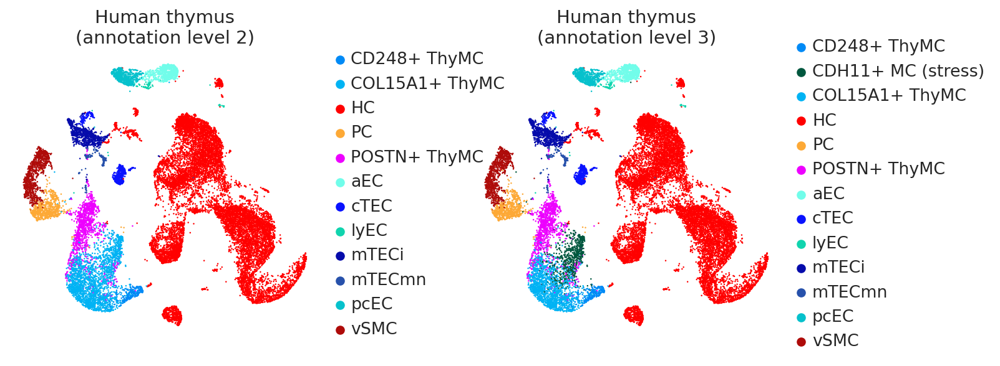

In [6]:
cell_type_l3 = []
cell_type_l2 = []
for MC_barcode in adata.obs.index:
    if MC_barcode in adata_MC.obs.index:
        cell_type_l2.append(adata_MC.obs.loc[MC_barcode]["cell_type_l2"])
        cell_type_l3.append(adata_MC.obs.loc[MC_barcode]["cell_type_l3"])
    else:
        cell_type_l2.append(adata.obs.loc[MC_barcode]["cell_type"])
        cell_type_l3.append(adata.obs.loc[MC_barcode]["cell_type"])
adata.obs["cell_type_l2"] = cell_type_l2
adata.obs["cell_type_l3"] = cell_type_l3
adata.obs["cell_type_l2"] = adata.obs["cell_type_l2"].astype("category")
adata.obs["cell_type_l3"] = adata.obs["cell_type_l3"].astype("category")
adata.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata.obs["cell_type_l2"].cat.categories]
adata.uns["cell_type_l3_colors"] = [paper_cmap[cell_type] for cell_type in adata.obs["cell_type_l3"].cat.categories]
del cell_type_l2, cell_type_l3

sc.pl.umap(adata, color=["cell_type_l2", "cell_type_l3"], frameon=False, title=["Human thymus\n(annotation level 2)", "Human thymus\n(annotation level 3)"], wspace=0.35)

## Stromal cells

In [66]:
adata_SC = adata.copy(); adata_SC = adata_SC[adata_SC.obs.cell_type != "HC"]
adata_SC.X = adata_SC.layers["counts"].copy()
os.mkdir(f"{PROJECT_DIR}/data/Human_SC_pagoda2_conos/")
adata_SC = run_conos_pagoda2(
    adata_SC,
    batch_key="sample_id",
    tmp_dir=f"{PROJECT_DIR}/data/Human_SC_pagoda2_conos/",
    script_path=f"{PROJECT_DIR}/tools/conos_wrapper.R"
)

(1/3) Writing .h5ad-file
(2/3) Running wrapper (it may takes a long time)
(3/3) Reading conos outputs


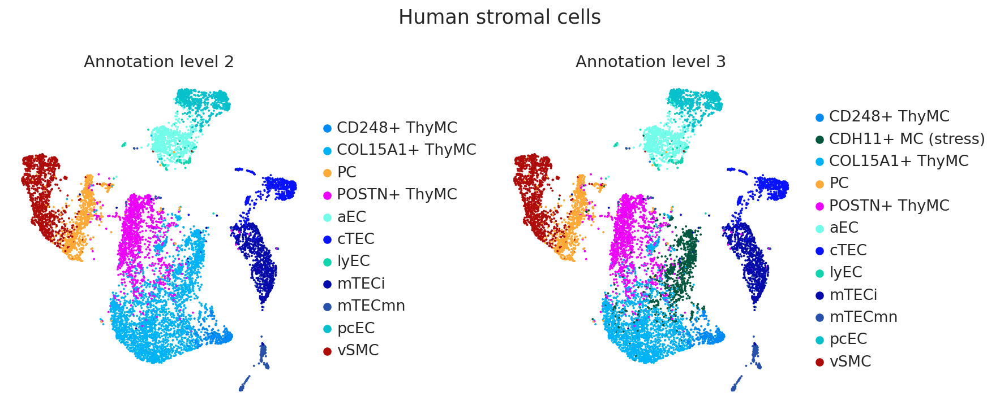

In [7]:
adata_SC.uns["cell_type_colors"] = [paper_cmap[cell_type] for cell_type in adata_SC.obs["cell_type"].cat.categories]
adata_SC.uns["cell_type_l2_colors"] = [paper_cmap[cell_type] for cell_type in adata_SC.obs["cell_type_l2"].cat.categories]
adata_SC.uns["cell_type_l3_colors"] = [paper_cmap[cell_type] for cell_type in adata_SC.obs["cell_type_l3"].cat.categories]

fig, axes = plt.subplots(ncols=2, dpi=150, figsize=(12, 5))
sc.pl.umap(adata_SC, color=["cell_type_l2"], frameon=False, title="Annotation level 2", ax=axes[0], show=False)
sc.pl.umap(adata_SC, color=["cell_type_l3"], frameon=False, title="Annotation level 3", ax=axes[1], show=False)
fig.suptitle("Human stromal cells")
fig.tight_layout()

## Pathways

In [8]:
import progeny

model = progeny.load_model(organism="Human", top=1000)
progeny.run(
    adata_MC,
    model,
    center=True,
    num_perm=100,
    norm=True,
    scale=True,
    use_raw=False,
    min_size=5
)

9054 genes found


100%|██████████| 100/100 [00:03<00:00, 28.80it/s]


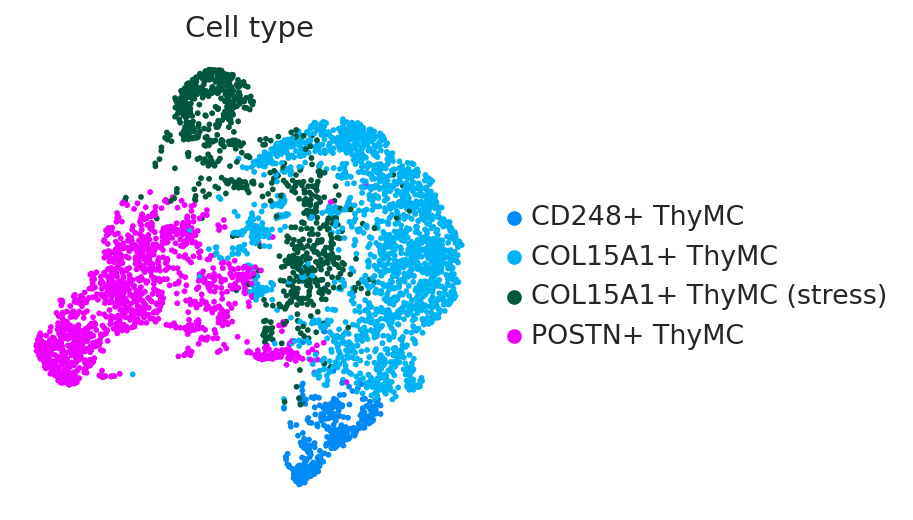

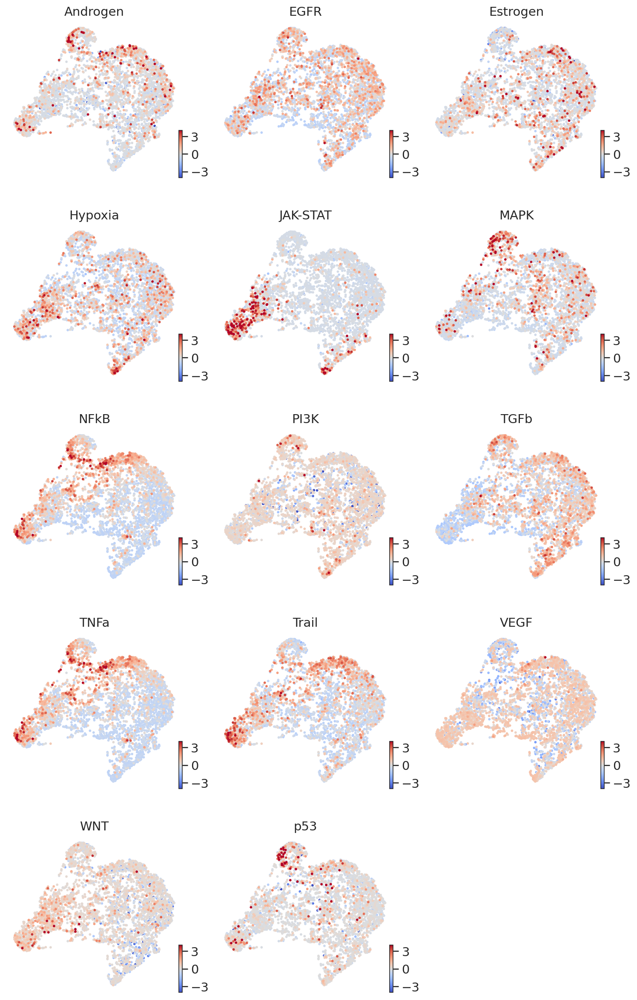

In [9]:
adata_MC_progeny = progeny.extract(adata_MC)
sc.pl.umap(adata_MC, color="cell_type_l3", title="Cell type", frameon=False)
scv.pl.umap(adata_MC_progeny, color=adata_MC_progeny.var.index, vmin=-4, vmax=4, cmap="coolwarm", ncols=3)

In [146]:
adata.write_h5ad(f"{PROJECT_DIR}/data/Human_AllCells_conos.h5ad")
adata_MC.write_h5ad(f"{PROJECT_DIR}/data/Human_MC_conos.h5ad")
adata_SC.write_h5ad(f"{PROJECT_DIR}/data/Human_SC_conos.h5ad")

## MC DEG analysis

In [10]:
adata_MC = sc.read_h5ad(f"{PROJECT_DIR}/data/Human_MC_conos.h5ad")
adata_MC.obs["sample_cell_type_l2"] = adata_MC.obs.sample_id.astype(str) + " | " + adata_MC.obs.cell_type_l2.astype(str)
adata_MC.obs["sample_cell_type"] = adata_MC.obs.sample_id.astype(str) + " | " + adata_MC.obs.cell_type.astype(str)

In [11]:
only_MC_DE = get_DESeq_multigroup(adata_MC,
                                  split_by="sample_cell_type_l2",
                                  grouping="cell_type_l2")

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating size factors

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) to use
  only letters, numbers, and delimiters '_' or '.', as these are safe characters
  for column names in R. [This is a message, not a warning or an error]

R[write to console]: estimating dispersions

R[write to console]: gene-wise dispersion estimates

R[write to console]: mean-dispersion relationship

R[write to console]:   Note: levels of factors in the design contain characters other than
  letters, numbers, '_' and '.'. It is recommended (but not required) 

In [12]:
target_df = {}
target_genes = ["CCL19", "FLT3LG", "IL15"]
for gene in target_genes:
    target_df[gene] = []
    for celltype in only_MC_DE["DE"]["POSTN+ ThyMC"].keys():
        target_df[gene].append(only_MC_DE["DE"]["POSTN+ ThyMC"][celltype][only_MC_DE["DE"]["POSTN+ ThyMC"][celltype].id == gene].pvalue[0])
target_df = pd.DataFrame(target_df, index=only_MC_DE["DE"]["POSTN+ ThyMC"].keys())
target_df.index = "POSTN+ ThyMC vs. " + target_df.index
target_df

,CCL19,FLT3LG,IL15
POSTN+ ThyMC vs. CD248+ ThyMC,1.357086e-08,0.042525,0.000024
POSTN+ ThyMC vs. COL15A1+ ThyMC,1.063416e-05,0.053363,0.000049


In [13]:
df = {}

ct_1 = "POSTN+ ThyMC"; ct_2 = "COL15A1+ ThyMC"; gene = "POSTN"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "POSTN+ ThyMC"; ct_2 = "CD248+ ThyMC"; gene = "POSTN"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "COL15A1+ ThyMC"; ct_2 = "POSTN+ ThyMC"; gene = "COL15A1"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "COL15A1+ ThyMC"; ct_2 = "CD248+ ThyMC"; gene = "COL15A1"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "CD248+ ThyMC"; ct_2 = "POSTN+ ThyMC"; gene = "CD248"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

ct_1 = "CD248+ ThyMC"; ct_2 = "COL15A1+ ThyMC"; gene = "CD248"
df[f"{ct_1} vs. {ct_2} ({gene})"] = only_MC_DE["DE"][ct_1][ct_2][only_MC_DE["DE"][ct_1][ct_2].id == gene].padj[0]

df = pd.DataFrame(df, index=["p_adj"]).T
df

,p_adj
POSTN+ ThyMC vs. COL15A1+ ThyMC (POSTN),4.619838e-13
POSTN+ ThyMC vs. CD248+ ThyMC (POSTN),3.683924e-01
COL15A1+ ThyMC vs. POSTN+ ThyMC (COL15A1),3.248495e-16
COL15A1+ ThyMC vs. CD248+ ThyMC (COL15A1),1.124924e-16
CD248+ ThyMC vs. POSTN+ ThyMC (CD248),1.157459e-16
CD248+ ThyMC vs. COL15A1+ ThyMC (CD248),5.488944e-07


In [14]:
df_counts = only_MC_DE["normalized counts"].loc[["POSTN", "COL15A1", "CD248"]].T
df_counts["sample_id"] = [index.split(" | ")[0] for index in df_counts.index]
df_counts["cell_type"] = [index.split(" | ")[1] for index in df_counts.index]
df_counts.index = range(len(df_counts))
df_counts.sort_values(by="cell_type")

id,POSTN,COL15A1,CD248,sample_id,cell_type
3,261.410636,69.954959,198.819357,SCG_HTS1_20200309_F,CD248+ ThyMC
5,71.809118,69.047229,127.046901,SCG_HTS1_20190722_F,CD248+ ThyMC
6,211.869287,43.534785,220.576244,SCG_HTS1_20200302_M,CD248+ ThyMC
1,22.184548,637.805754,56.570597,SCG_HTS1_20200302_M,COL15A1+ ThyMC
2,11.821093,546.528530,40.191716,SCG_HTS1_20190722_F,COL15A1+ ThyMC
7,22.719854,680.964516,53.012993,SCG_HTS1_20200309_F,COL15A1+ ThyMC
0,481.944516,124.029839,30.475903,SCG_HTS1_20200302_M,POSTN+ ThyMC
4,147.059551,72.192871,21.390480,SCG_HTS1_20200309_F,POSTN+ ThyMC
8,425.341236,50.612687,16.059795,SCG_HTS1_20190722_F,POSTN+ ThyMC
